In [1]:
# import modules
import funcs
import mrsobs

import numpy as np
from scipy.optimize import curve_fit
from scipy.signal import (savgol_filter,medfilt)
from scipy.interpolate import (InterpolatedUnivariateSpline,interp1d)
from matplotlib import pyplot as plt
plt.style.use('presentation')
%matplotlib notebook

import warnings
warnings.simplefilter('ignore')

In [2]:
# Define paths to data
workDir   = '/Users/ioannisa/Desktop/python/miri_devel/'
cdpDir    = workDir+'cdp_data/'
d2cMapDir = workDir+'notebooks/distortionMaps/'
lvl2path  = workDir+'FM_data/LVL2/'

<IPython.core.display.Javascript object>


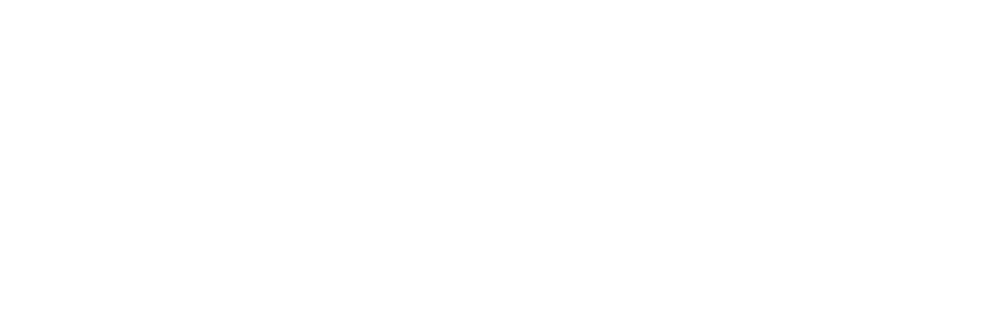

<IPython.core.display.Javascript object>


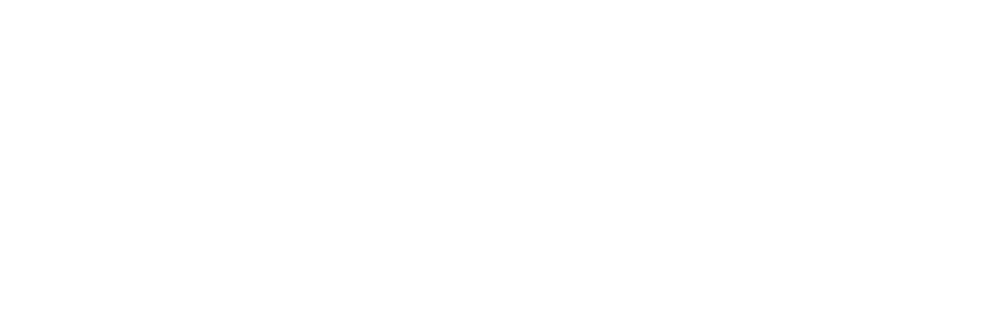

In [3]:
# wavelength solution is most accurate for band 1B
band = '1A'
# Get wavelength calibration pixel map
d2cMaps   = funcs.load_obj('d2cMaps_band{}_tr90pc'.format(band),path=d2cMapDir)
lambdaMap = d2cMaps['lambdaMap']
nslices = d2cMaps['nslices']
# load MRS images
ext_source_sci,ext_source_bkg = mrsobs.FM_MTS_BB_extended_source(lvl2path,band,bb_temp='800K')
ext_source_bkgsubtr = ext_source_sci-ext_source_bkg
# Pixel trace in MRS slice
sliceID,alpha_position = nslices/2,0.
ypos,xpos = funcs.detpixel_trace(band,d2cMaps,sliceID=sliceID,alpha_pos=alpha_position)

# Normalize the extended source spectrum to the fringe peak profile
if band == '1A':
    thres=0.3 
    min_dist=6
elif band == '1B':
    thres=0.3 
    min_dist=6
elif band == '1C':
    thres=0.3 
    min_dist=8
elif band == '2A':
    thres=0.3 
    min_dist=9
ext_source_norm = funcs.norm_fringe(ext_source_bkgsubtr[ypos,xpos], thres=thres, min_dist=min_dist)
ext_source_norm_neg = funcs.norm_fringe(-ext_source_bkgsubtr[ypos,xpos], thres=thres, min_dist=min_dist)
all_peaks = np.sort(list(lambdaMap[ypos,xpos][ext_source_norm[1]])+list(lambdaMap[ypos,xpos][ext_source_norm_neg[1]]))
# Compute zeroth order optical thickness of detector from fringe peak separation
fringepeaks_wavelength = lambdaMap[ypos,xpos][ext_source_norm[1]]       # microns
fringepeaks_wavenumber = np.flipud(10000./fringepeaks_wavelength)       # cm-1

# Compute first order optical thickness of detector from fitting Lorentzian profiles to the fringe peaks
wvnrs = np.flipud(10000./lambdaMap[ypos,xpos])
wvnr_arr = np.arange(wvnrs[0],wvnrs[-1],0.1)
ext_source_norm = funcs.norm_fringe(np.flipud(ext_source_bkgsubtr[ypos,xpos]), thres=thres, min_dist=min_dist)

plt.figure(figsize=(12,4))
plt.plot(wvnrs,ext_source_norm[0]/ext_source_norm[2])
mu = np.zeros(len(ext_source_norm[1]))
for i,peak in enumerate(ext_source_norm[1]):
    amp   = (ext_source_norm[0]/ext_source_norm[2])[peak]
    mean  = wvnrs[peak]
    sigma = 2*(wvnrs[peak+1] - wvnrs[peak])

    popt,pcov = curve_fit(funcs.lorentzian_profile,wvnrs[peak-2:peak+3],(ext_source_norm[0]/ext_source_norm[2])[peak-2:peak+3],p0=[amp,mean,sigma],absolute_sigma=True,bounds=([0,0,0],[np.inf,np.inf,np.inf]))
    
    plt.plot(wvnr_arr,funcs.lorentzian_profile(wvnr_arr,*popt))
    mu[i] = popt[1]
plt.hlines(0.5,wvnr_arr[0],wvnr_arr[-1],'k',linestyle='dashed')
plt.tight_layout()

plt.figure(figsize=(12,4))
plt.plot(fringepeaks_wavenumber[:-1],10000./(2*np.diff(fringepeaks_wavenumber)),label='Fringe separation')
plt.plot(mu[:-1],10000./(2*np.diff(mu)),label='Lorentzian profile fit')
plt.tight_layout()

fringe_peak_separation_1 = 10000./(2*np.diff(fringepeaks_wavenumber))
lorentzian_fit_mu_1 = mu.copy()

<IPython.core.display.Javascript object>


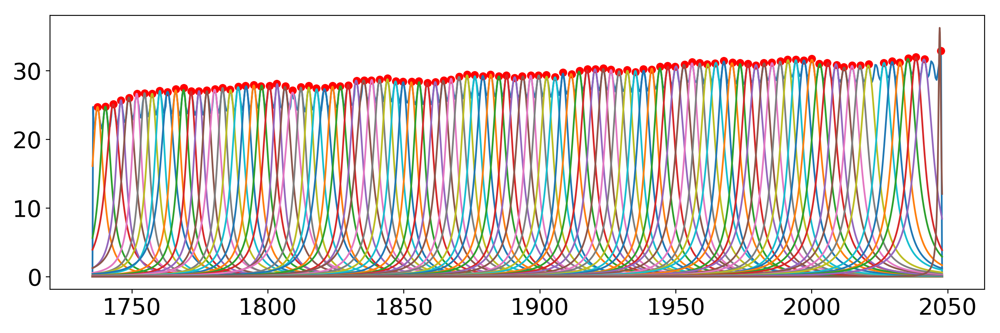

<IPython.core.display.Javascript object>


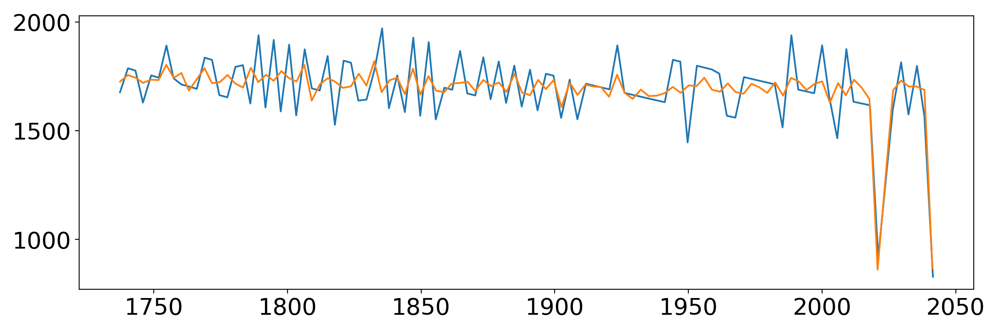

In [14]:
plt.close('all')
# wavelength solution is most accurate for band 1B
band = '1A'
# Get wavelength calibration pixel map
d2cMaps   = funcs.load_obj('d2cMaps_band{}_tr90pc'.format(band),path=d2cMapDir)
lambdaMap = d2cMaps['lambdaMap']
nslices = d2cMaps['nslices']
# load MRS images
ext_source_sci,ext_source_bkg = mrsobs.FM_MTS_BB_extended_source(lvl2path,band,bb_temp='800K')
ext_source_bkgsubtr = ext_source_sci-ext_source_bkg
# Pixel trace in MRS slice
sliceID,alpha_position = nslices/2,0.
ypos,xpos = funcs.detpixel_trace(band,d2cMaps,sliceID=sliceID,alpha_pos=alpha_position)

# Normalize the extended source spectrum to the fringe peak profile
if band == '1A':
    thres=0.3 
    min_dist=6
elif band == '1B':
    thres=0.3 
    min_dist=6
elif band == '1C':
    thres=0.3 
    min_dist=8
elif band == '2A':
    thres=0.3 
    min_dist=9
elif band == '2B':
    thres=0.3 
    min_dist=11
ext_source_norm = funcs.norm_fringe(np.flipud(ext_source_bkgsubtr[ypos,xpos]), thres=thres, min_dist=min_dist)
# Compute zeroth order optical thickness of detector from fringe peak separation
fringepeaks_wavenumber = np.flipud(10000./lambdaMap[ypos,xpos])[ext_source_norm[1]]       # cm-1

# Compute first order optical thickness of detector from fitting Lorentzian profiles to the fringe peaks
wvnrs = np.flipud(10000./lambdaMap[ypos,xpos])
wvnr_arr = np.arange(wvnrs[0],wvnrs[-1],0.1)
sig_arr = np.flipud(ext_source_bkgsubtr[ypos,xpos])
sig_arr[np.isnan(sig_arr)] = 0
peaks = ext_source_norm[1]

plt.figure(figsize=(12,4))
plt.plot(wvnrs,sig_arr)
plt.plot(wvnrs[peaks],sig_arr[peaks],'ro')
mu = np.zeros(len(peaks))
for i,peak in enumerate(peaks):
    amp = sig_arr[peak]
    mean = wvnrs[peak]
    sigma = 2*(wvnrs[peak+1] - wvnrs[peak])

    popt,pcov = curve_fit(funcs.lorentzian_profile,wvnrs[peak-2:peak+3],sig_arr[peak-2:peak+3],p0=[amp,mean,sigma],absolute_sigma=True,bounds=([0,0,0],[np.inf,np.inf,np.inf]))

    plt.plot(wvnr_arr,funcs.lorentzian_profile(wvnr_arr,*popt))
    mu[i] = popt[1]
plt.tight_layout()

plt.figure(figsize=(12,4))
plt.plot(fringepeaks_wavenumber[:-1],10000./(2*np.diff(fringepeaks_wavenumber)),label='Fringe separation')
plt.plot(mu[:-1],10000./(2*np.diff(mu)),label='Lorentzian profile fit')
plt.tight_layout()

fringe_peak_separation_2 = fringepeaks_wavenumber.copy()
lorentzian_fit_mu_2 = mu.copy()

<IPython.core.display.Javascript object>


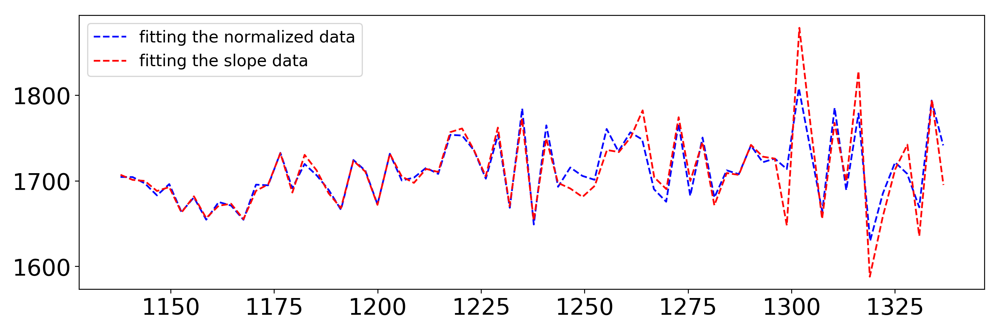

In [10]:
plt.close('all')
plt.figure(figsize=(12,4))
plt.plot(lorentzian_fit_mu_1[:-2],10000./(2*np.diff(lorentzian_fit_mu_1))[:-1],'b--',label='fitting the normalized data')
plt.plot(lorentzian_fit_mu_2[:-2],10000./(2*np.diff(lorentzian_fit_mu_2))[:-1],'r--',label='fitting the slope data')
plt.legend()
plt.tight_layout()

In [36]:
plt.close('all')
# wavelength solution is most accurate for band 1B
band = '1A'
# Get wavelength calibration pixel map
d2cMaps   = funcs.load_obj('d2cMaps_band{}_tr90pc'.format(band),path=d2cMapDir)
lambdaMap = d2cMaps['lambdaMap']
wvnrMap =  np.flipud(10000./lambdaMap)
detThicknessMap = np.zeros(wvnrMap.shape)
nslices = d2cMaps['nslices']
# load MRS images
ext_source_sci,ext_source_bkg = mrsobs.FM_MTS_BB_extended_source(lvl2path,band,bb_temp='800K')
ext_source_bkgsubtr = ext_source_sci-ext_source_bkg

# Pixel trace in MRS slice
alpha_position = 0.

# find fringe peaks
if band == '1A':
    thres=0.3 
    min_dist=6
elif band == '1B':
    thres=0.3 
    min_dist=6
elif band == '1C':
    thres=0.3 
    min_dist=8
elif band == '2A':
    thres=0.3 
    min_dist=9

for islice in range(1,nslices+1):
    print 'Slice {}'.format(islice)
    ypos,xpos_alpha0 = funcs.detpixel_trace(band,d2cMaps,sliceID=islice,alpha_pos=alpha_position)
    
    for xpos_offset in range(-10,11):
        try:
            xpos = xpos_alpha0+xpos_offset
            # Normalize the extended source spectrum to the fringe peak profile
            ext_source_norm = funcs.norm_fringe(np.flipud(ext_source_bkgsubtr[ypos,xpos]), thres=thres, min_dist=min_dist)

            # Compute first order optical thickness of detector from fitting Lorentzian profiles to the fringe peaks
            wvnrs = np.flipud(10000./lambdaMap[ypos,xpos])
            sig_arr = np.flipud(ext_source_bkgsubtr[ypos,xpos])
            sig_arr[np.isnan(sig_arr)] = 0
            peaks = ext_source_norm[1]

            mu = np.zeros(len(peaks))
            for i,peak in enumerate(peaks):
                amp = sig_arr[peak]
                mean = wvnrs[peak]
                sigma = 2*(wvnrs[peak+1] - wvnrs[peak])
                popt,pcov = curve_fit(funcs.lorentzian_profile,wvnrs[peak-2:peak+3],sig_arr[peak-2:peak+3],p0=[amp,mean,sigma],absolute_sigma=True,bounds=([0,0,0],[np.inf,np.inf,np.inf]))
                mu[i] = popt[1]
            detThickness = 10000./(2*np.diff(mu))
            interp_detThickness = InterpolatedUnivariateSpline(mu[:-1],detThickness,k=3,ext=3)

            detThicknessMap[ypos,xpos] = interp_detThickness(wvnrs)
        except:
            continue
detThicknessMap_band1A = detThicknessMap.copy()

Slice 1
Slice 2
Slice 3
Slice 4
Slice 5
Slice 6
Slice 7
Slice 8
Slice 9
Slice 10
Slice 11
Slice 12
Slice 13
Slice 14
Slice 15
Slice 16
Slice 17
Slice 18
Slice 19
Slice 20
Slice 21


<IPython.core.display.Javascript object>


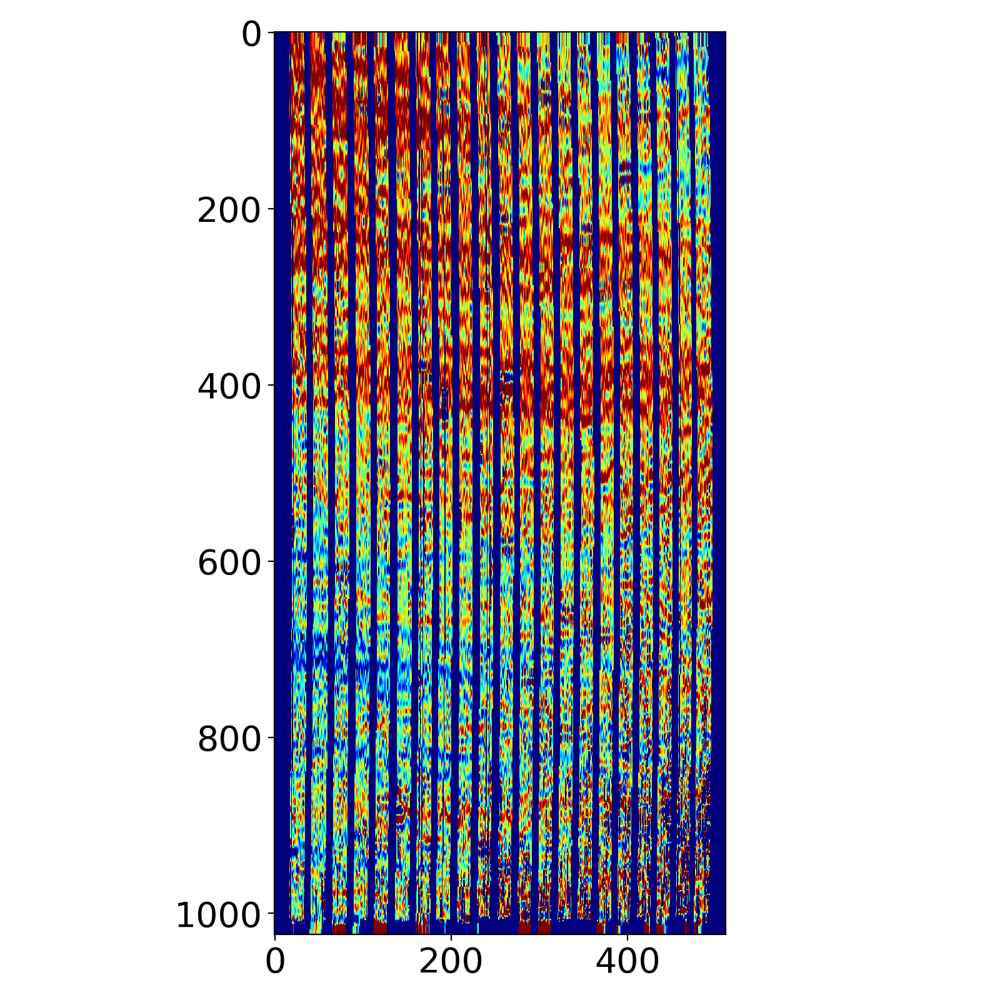

In [37]:
plt.figure(figsize=(8,8))
plt.imshow(detThicknessMap_band1A[:,:512],vmin=1650,vmax=1750,cmap='jet')
plt.tight_layout()

In [7]:
plt.close('all')
# wavelength solution is most accurate for band 1B
band = '1B'
# Get wavelength calibration pixel map
d2cMaps   = funcs.load_obj('d2cMaps_band{}_tr90pc'.format(band),path=d2cMapDir)
lambdaMap = d2cMaps['lambdaMap']
wvnrMap =  np.flipud(10000./lambdaMap)
detThicknessMap = np.zeros(wvnrMap.shape)
nslices = d2cMaps['nslices']
# load MRS images
ext_source_sci,ext_source_bkg = mrsobs.FM_MTS_BB_extended_source(lvl2path,band,bb_temp='800K')
ext_source_bkgsubtr = ext_source_sci-ext_source_bkg

# Pixel trace in MRS slice
alpha_position = 0.

# find fringe peaks
if band == '1A':
    thres=0.3 
    min_dist=6
elif band == '1B':
    thres=0.3 
    min_dist=6
elif band == '1C':
    thres=0.3 
    min_dist=8
elif band == '2A':
    thres=0.3 
    min_dist=9

for islice in range(1,nslices+1):
    print 'Slice {}'.format(islice)
    ypos,xpos_alpha0 = funcs.detpixel_trace(band,d2cMaps,sliceID=islice,alpha_pos=alpha_position)
    
    for xpos_offset in range(-10,11):
        try:
            xpos = xpos_alpha0+xpos_offset
            # Normalize the extended source spectrum to the fringe peak profile
            ext_source_norm = funcs.norm_fringe(np.flipud(ext_source_bkgsubtr[ypos,xpos]), thres=thres, min_dist=min_dist)

            # Compute first order optical thickness of detector from fitting Lorentzian profiles to the fringe peaks
            wvnrs = np.flipud(10000./lambdaMap[ypos,xpos])
            sig_arr = np.flipud(ext_source_bkgsubtr[ypos,xpos])
            sig_arr[np.isnan(sig_arr)] = 0
            peaks = ext_source_norm[1]

            mu = np.zeros(len(peaks))
            for i,peak in enumerate(peaks):
                amp = sig_arr[peak]
                mean = wvnrs[peak]
                sigma = 2*(wvnrs[peak+1] - wvnrs[peak])
                popt,pcov = curve_fit(funcs.lorentzian_profile,wvnrs[peak-2:peak+3],sig_arr[peak-2:peak+3],p0=[amp,mean,sigma],absolute_sigma=True,bounds=([0,0,0],[np.inf,np.inf,np.inf]))
                mu[i] = popt[1]
            detThickness = 10000./(2*np.diff(mu))
            interp_detThickness = InterpolatedUnivariateSpline(mu[:-1],detThickness,k=3,ext=3)

            detThicknessMap[ypos,xpos] = interp_detThickness(wvnrs)
        except:
            continue
detThicknessMap_band1B = detThicknessMap.copy()

Slice 1
Slice 2
Slice 3
Slice 4
Slice 5
Slice 6
Slice 7
Slice 8
Slice 9
Slice 10
Slice 11
Slice 12
Slice 13
Slice 14
Slice 15
Slice 16
Slice 17
Slice 18
Slice 19
Slice 20
Slice 21


<IPython.core.display.Javascript object>


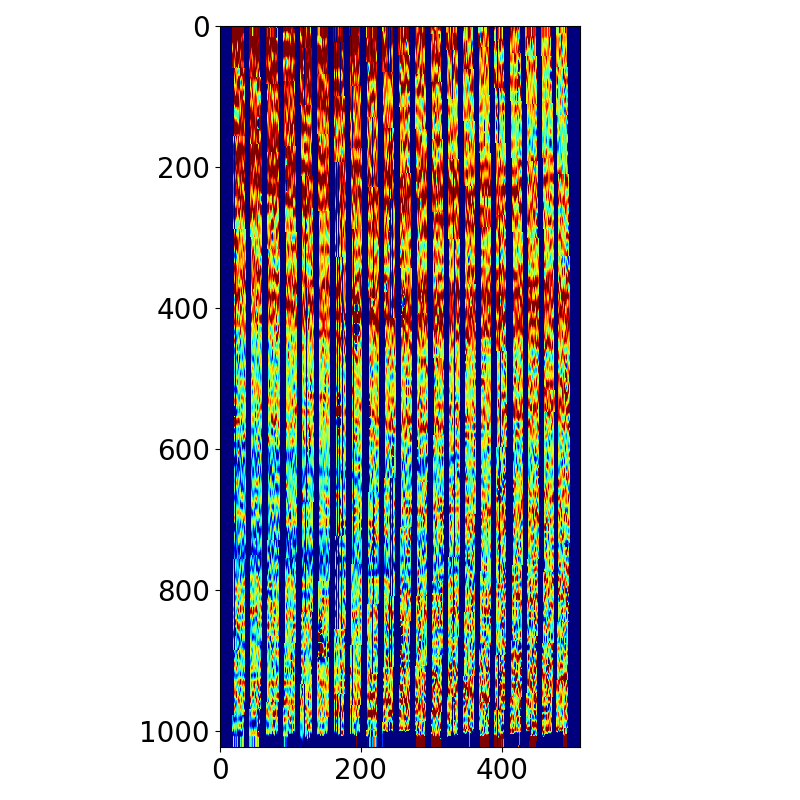

In [8]:
plt.figure(figsize=(8,8))
plt.imshow(detThicknessMap_band1B[:,:512],vmin=1650,vmax=1750,cmap='jet')
plt.tight_layout()

In [9]:
plt.close('all')
# wavelength solution is most accurate for band 1B
band = '1C'
# Get wavelength calibration pixel map
d2cMaps   = funcs.load_obj('d2cMaps_band{}_tr90pc'.format(band),path=d2cMapDir)
lambdaMap = d2cMaps['lambdaMap']
wvnrMap =  np.flipud(10000./lambdaMap)
detThicknessMap = np.zeros(wvnrMap.shape)
nslices = d2cMaps['nslices']
# load MRS images
ext_source_sci,ext_source_bkg = mrsobs.FM_MTS_BB_extended_source(lvl2path,band,bb_temp='800K')
ext_source_bkgsubtr = ext_source_sci-ext_source_bkg

# Pixel trace in MRS slice
alpha_position = 0.

# find fringe peaks
if band == '1A':
    thres=0.3 
    min_dist=6
elif band == '1B':
    thres=0.3 
    min_dist=6
elif band == '1C':
    thres=0.3 
    min_dist=8
elif band == '2A':
    thres=0.3 
    min_dist=9

for islice in range(1,nslices+1):
    print 'Slice {}'.format(islice)
    ypos,xpos_alpha0 = funcs.detpixel_trace(band,d2cMaps,sliceID=islice,alpha_pos=alpha_position)
    
    for xpos_offset in range(-10,11):
        try:
            xpos = xpos_alpha0+xpos_offset
            # Normalize the extended source spectrum to the fringe peak profile
            ext_source_norm = funcs.norm_fringe(np.flipud(ext_source_bkgsubtr[ypos,xpos]), thres=thres, min_dist=min_dist)

            # Compute first order optical thickness of detector from fitting Lorentzian profiles to the fringe peaks
            wvnrs = np.flipud(10000./lambdaMap[ypos,xpos])
            sig_arr = np.flipud(ext_source_bkgsubtr[ypos,xpos])
            sig_arr[np.isnan(sig_arr)] = 0
            peaks = ext_source_norm[1]

            mu = np.zeros(len(peaks))
            for i,peak in enumerate(peaks):
                amp = sig_arr[peak]
                mean = wvnrs[peak]
                sigma = 2*(wvnrs[peak+1] - wvnrs[peak])
                popt,pcov = curve_fit(funcs.lorentzian_profile,wvnrs[peak-2:peak+3],sig_arr[peak-2:peak+3],p0=[amp,mean,sigma],absolute_sigma=True,bounds=([0,0,0],[np.inf,np.inf,np.inf]))
                mu[i] = popt[1]
            detThickness = 10000./(2*np.diff(mu))
            interp_detThickness = InterpolatedUnivariateSpline(mu[:-1],detThickness,k=3,ext=3)

            detThicknessMap[ypos,xpos] = interp_detThickness(wvnrs)
        except:
            continue
detThicknessMap_band1C = detThicknessMap.copy()

Slice 1
Slice 2
Slice 3
Slice 4
Slice 5
Slice 6
Slice 7
Slice 8
Slice 9
Slice 10
Slice 11
Slice 12
Slice 13
Slice 14
Slice 15
Slice 16
Slice 17
Slice 18
Slice 19
Slice 20
Slice 21


<IPython.core.display.Javascript object>


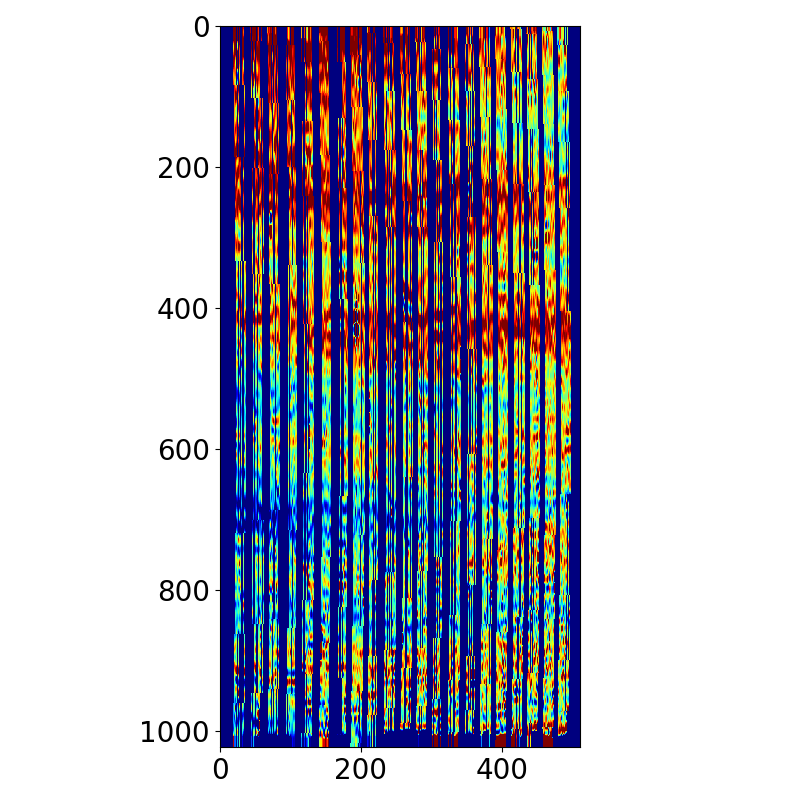

In [10]:
plt.figure(figsize=(8,8))
plt.imshow(detThicknessMap_band1C[:,:512],vmin=1650,vmax=1750,cmap='jet')
plt.tight_layout()

<IPython.core.display.Javascript object>


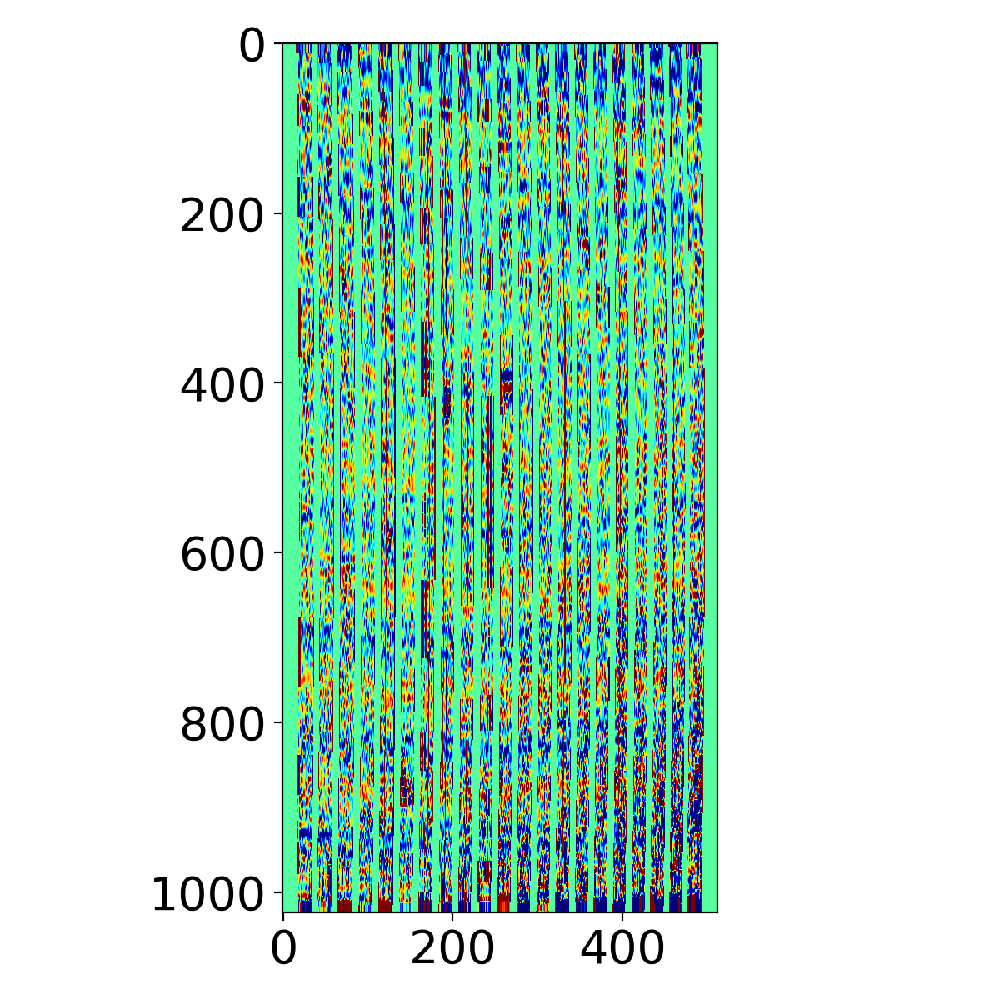

<IPython.core.display.Javascript object>


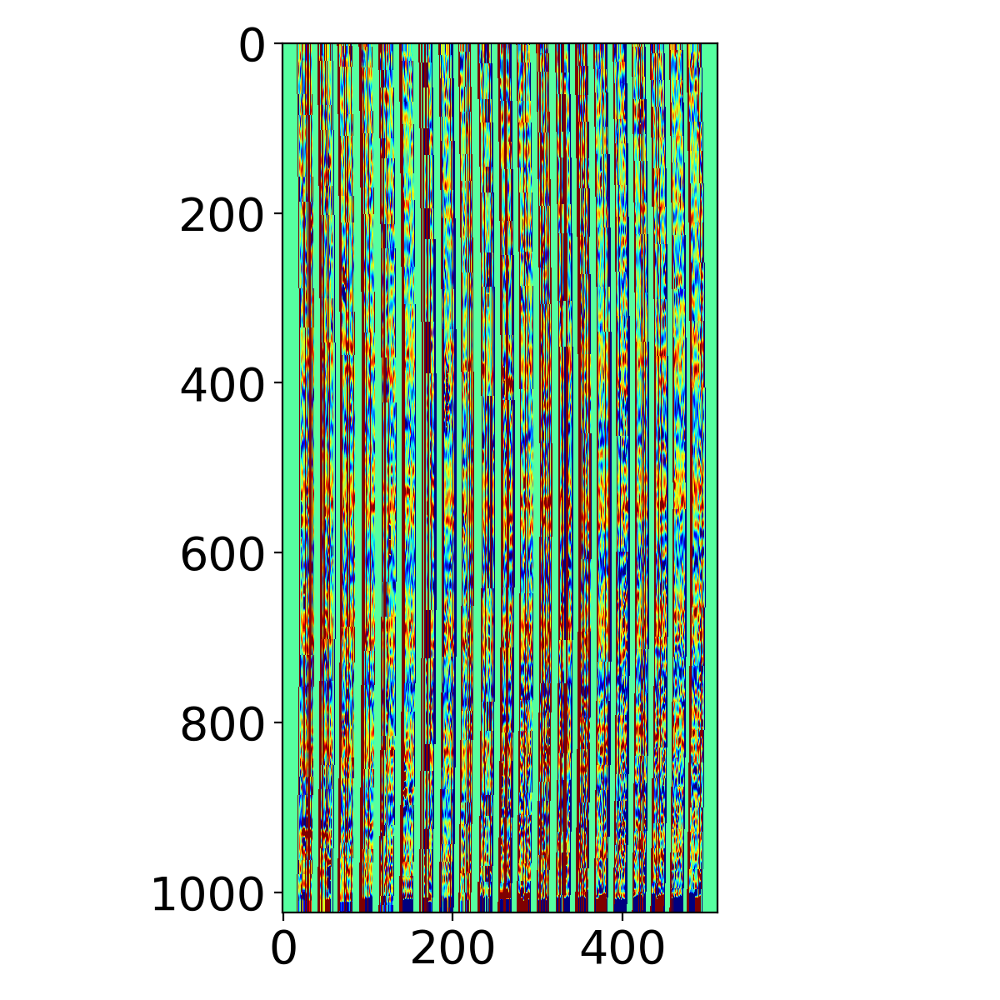

<IPython.core.display.Javascript object>


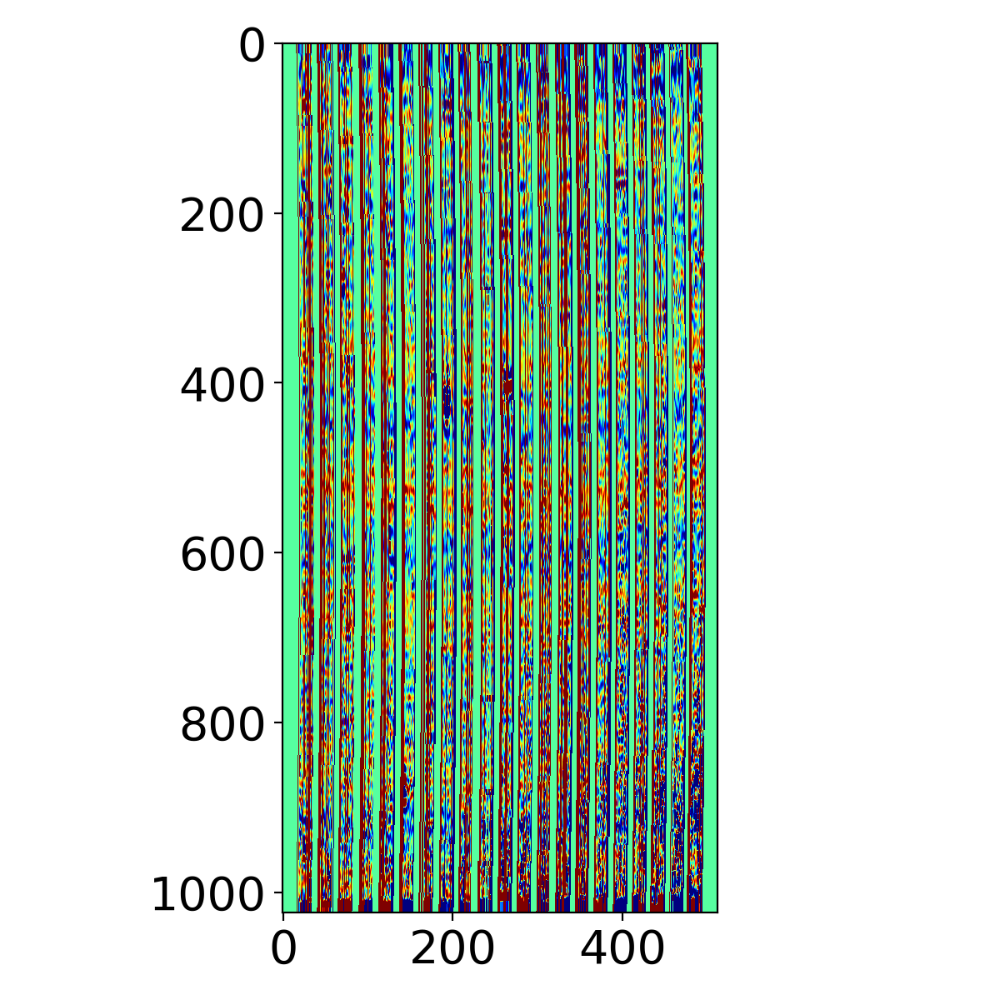

In [39]:
test_band1A = detThicknessMap_band1A.copy()
test_band1B = detThicknessMap_band1B.copy()
test_band1C = detThicknessMap_band1C.copy()
sel = (detThicknessMap_band1A==0) & (detThicknessMap_band1B==0) & (detThicknessMap_band1C==0)

test_band1A[sel] = 0
test_band1B[sel] = 0
test_band1C[sel] = 0

plt.figure(figsize=(6,6))
plt.imshow((test_band1A-test_band1B)[:,:512],cmap='jet',vmin=-50,vmax=60)
plt.tight_layout()

plt.figure(figsize=(6,6))
plt.imshow((test_band1B-test_band1C)[:,:512],cmap='jet',vmin=-50,vmax=60)
plt.tight_layout()

plt.figure(figsize=(6,6))
plt.imshow((test_band1A-test_band1C)[:,:512],cmap='jet',vmin=-50,vmax=60)
plt.tight_layout()

<IPython.core.display.Javascript object>


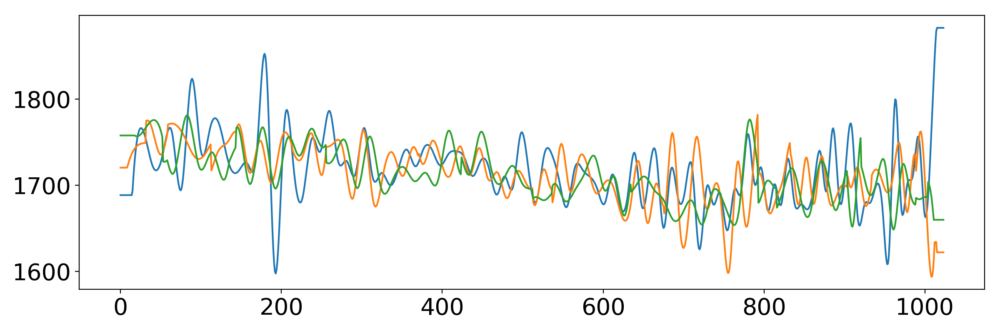

<IPython.core.display.Javascript object>


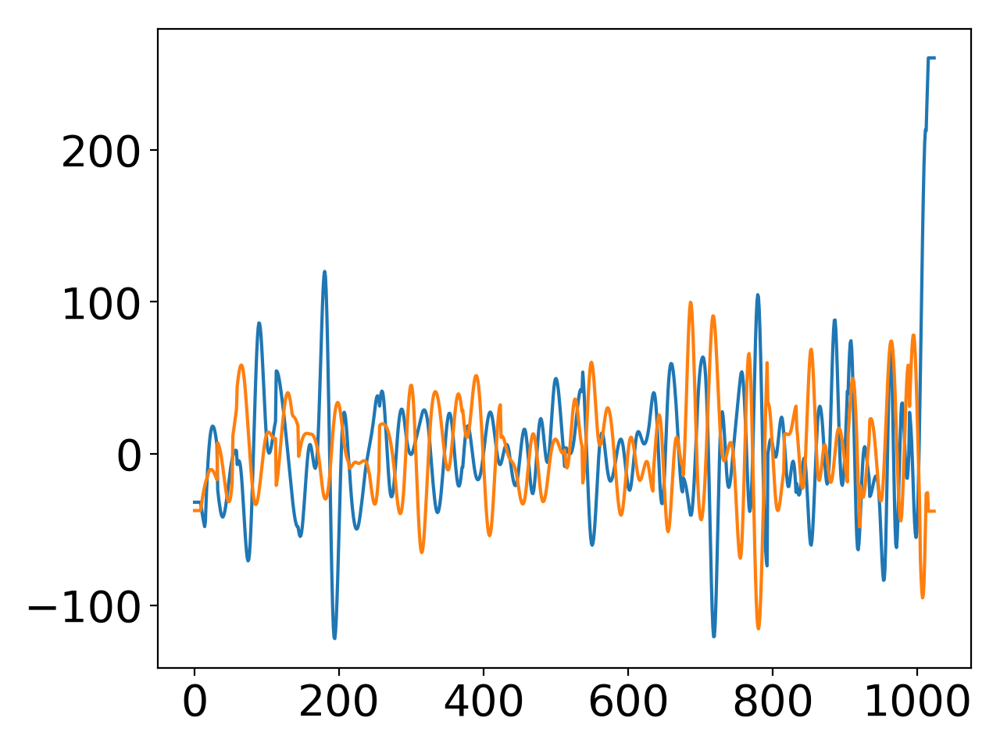

In [41]:
ypos,xpos = funcs.detpixel_trace(band,d2cMaps,sliceID=nslices/2-1,alpha_pos=0.)

plt.figure(figsize=(12,4))
plt.plot(test_band1A[ypos,xpos])
plt.plot(test_band1B[ypos,xpos])
plt.plot(test_band1C[ypos,xpos])
plt.tight_layout()

plt.figure()
plt.plot((test_band1A-test_band1B)[ypos,xpos])
plt.plot((test_band1B-test_band1C)[ypos,xpos])
plt.tight_layout()

In [11]:
plt.close('all')
# wavelength solution is most accurate for band 1B
band = '2A'
# Get wavelength calibration pixel map
d2cMaps   = funcs.load_obj('d2cMaps_band{}_tr90pc'.format(band),path=d2cMapDir)
lambdaMap = d2cMaps['lambdaMap']
wvnrMap =  np.flipud(10000./lambdaMap)
detThicknessMap = np.zeros(wvnrMap.shape)
nslices = d2cMaps['nslices']
# load MRS images
ext_source_sci,ext_source_bkg = mrsobs.FM_MTS_BB_extended_source(lvl2path,band,bb_temp='800K')
ext_source_bkgsubtr = ext_source_sci-ext_source_bkg

# Pixel trace in MRS slice
alpha_position = 0.

# find fringe peaks
if band == '1A':
    thres=0.3 
    min_dist=6
elif band == '1B':
    thres=0.3 
    min_dist=6
elif band == '1C':
    thres=0.3 
    min_dist=8
elif band == '2A':
    thres=0.3 
    min_dist=9

for islice in range(1,nslices+1):
    print 'Slice {}'.format(islice)
    ypos,xpos_alpha0 = funcs.detpixel_trace(band,d2cMaps,sliceID=islice,alpha_pos=alpha_position)
    
    for xpos_offset in range(-10,11):
        try:
            xpos = xpos_alpha0+xpos_offset
            # Normalize the extended source spectrum to the fringe peak profile
            ext_source_norm = funcs.norm_fringe(np.flipud(ext_source_bkgsubtr[ypos,xpos]), thres=thres, min_dist=min_dist)

            # Compute first order optical thickness of detector from fitting Lorentzian profiles to the fringe peaks
            wvnrs = np.flipud(10000./lambdaMap[ypos,xpos])
            sig_arr = np.flipud(ext_source_bkgsubtr[ypos,xpos])
            sig_arr[np.isnan(sig_arr)] = 0
            peaks = ext_source_norm[1]

            mu = np.zeros(len(peaks))
            for i,peak in enumerate(peaks):
                amp = sig_arr[peak]
                mean = wvnrs[peak]
                sigma = 2*(wvnrs[peak+1] - wvnrs[peak])
                popt,pcov = curve_fit(funcs.lorentzian_profile,wvnrs[peak-2:peak+3],sig_arr[peak-2:peak+3],p0=[amp,mean,sigma],absolute_sigma=True,bounds=([0,0,0],[np.inf,np.inf,np.inf]))
                mu[i] = popt[1]
            detThickness = 10000./(2*np.diff(mu))
            interp_detThickness = InterpolatedUnivariateSpline(mu[:-1],detThickness,k=3,ext=3)

            detThicknessMap[ypos,xpos] = interp_detThickness(wvnrs)
        except:
            continue
detThicknessMap_band2A = detThicknessMap.copy()

Slice 1
Slice 2
Slice 3
Slice 4
Slice 5
Slice 6
Slice 7
Slice 8
Slice 9
Slice 10
Slice 11
Slice 12
Slice 13
Slice 14
Slice 15
Slice 16
Slice 17


<IPython.core.display.Javascript object>


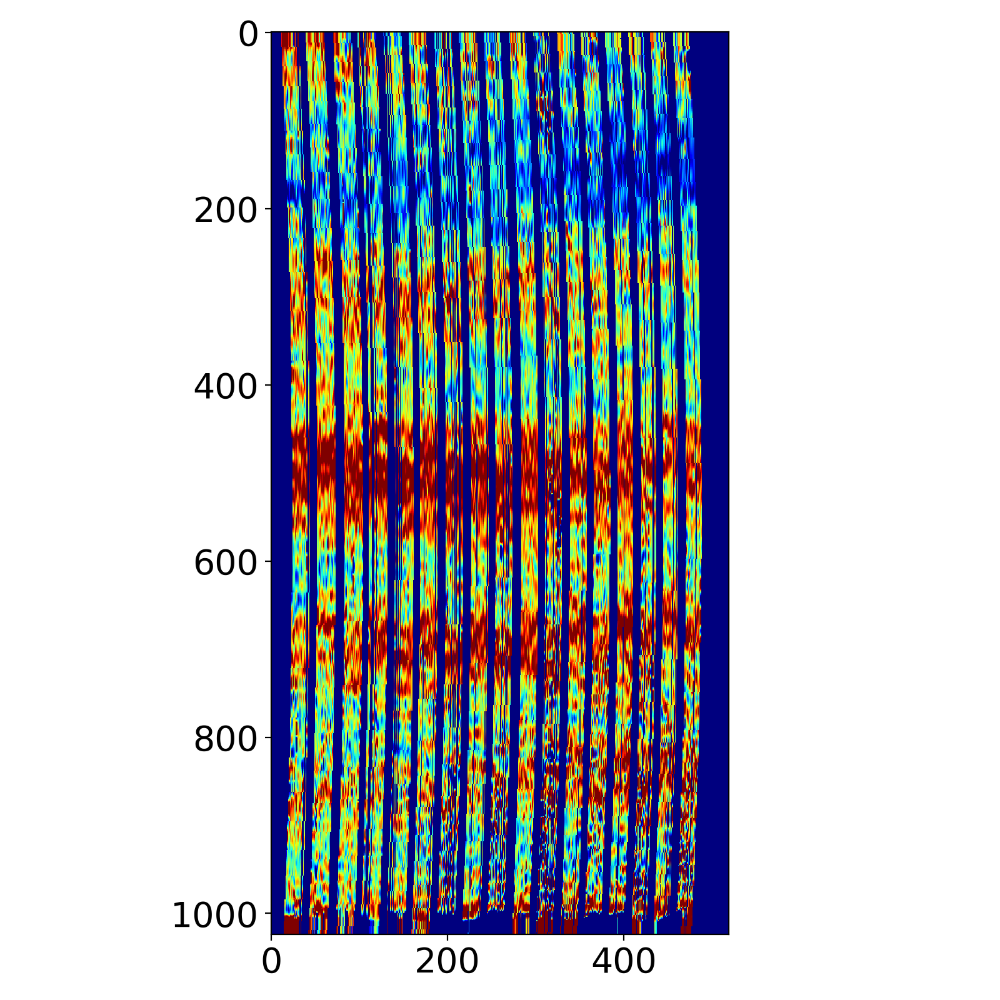

In [13]:
plt.figure(figsize=(8,8))
plt.imshow(detThicknessMap_band2A[:,512:],vmin=1650,vmax=1750,cmap='jet')
plt.tight_layout()

In [ ]:
plt.close('all')
# wavelength solution is most accurate for band 1B
band = '2A'
# Get wavelength calibration pixel map
d2cMaps   = funcs.load_obj('d2cMaps_band{}_tr90pc'.format(band),path=d2cMapDir)
lambdaMap = d2cMaps['lambdaMap']
wvnrMap =  np.flipud(10000./lambdaMap)
detThicknessMap = np.zeros(wvnrMap.shape)
nslices = d2cMaps['nslices']
# load MRS images
ext_source_sci,ext_source_bkg = mrsobs.FM_MTS_BB_extended_source(lvl2path,band,bb_temp='800K')
ext_source_bkgsubtr = ext_source_sci-ext_source_bkg

# Pixel trace in MRS slice
alpha_position = 0.

# find fringe peaks
if band == '1A':
    thres=0.3 
    min_dist=6
elif band == '1B':
    thres=0.3 
    min_dist=6
elif band == '1C':
    thres=0.3 
    min_dist=8
elif band == '2A':
    thres=0.3 
    min_dist=9

for islice in range(1,nslices+1):
    print 'Slice {}'.format(islice)
    ypos,xpos_alpha0 = funcs.detpixel_trace(band,d2cMaps,sliceID=islice,alpha_pos=alpha_position)
    
    for xpos_offset in range(-10,11):
        try:
            xpos = xpos_alpha0+xpos_offset
            # Normalize the extended source spectrum to the fringe peak profile
            ext_source_norm = funcs.norm_fringe(np.flipud(ext_source_bkgsubtr[ypos,xpos]), thres=thres, min_dist=min_dist)

            # Compute first order optical thickness of detector from fitting Lorentzian profiles to the fringe peaks
            wvnrs = np.flipud(10000./lambdaMap[ypos,xpos])
            sig_arr = np.flipud(ext_source_bkgsubtr[ypos,xpos])
            sig_arr[np.isnan(sig_arr)] = 0
            peaks = ext_source_norm[1]

            mu = np.zeros(len(peaks))
            for i,peak in enumerate(peaks):
                amp = sig_arr[peak]
                mean = wvnrs[peak]
                sigma = 2*(wvnrs[peak+1] - wvnrs[peak])
                popt,pcov = curve_fit(funcs.lorentzian_profile,wvnrs[peak-2:peak+3],sig_arr[peak-2:peak+3],p0=[amp,mean,sigma],absolute_sigma=True,bounds=([0,0,0],[np.inf,np.inf,np.inf]))
                mu[i] = popt[1]
            detThickness = 10000./(2*np.diff(mu))
            interp_detThickness = InterpolatedUnivariateSpline(mu[:-1],detThickness,k=3,ext=3)

            detThicknessMap[ypos,xpos] = interp_detThickness(wvnrs)
        except:
            continue
detThicknessMap_band2A = detThicknessMap.copy()

# Residuals on Lorentzian fit

<IPython.core.display.Javascript object>


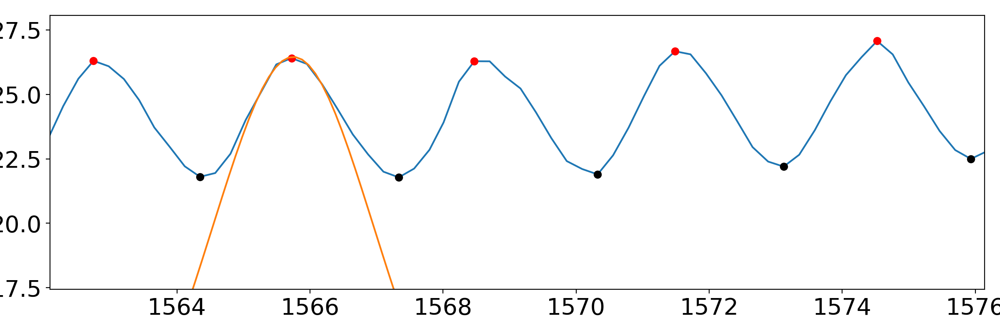

<IPython.core.display.Javascript object>


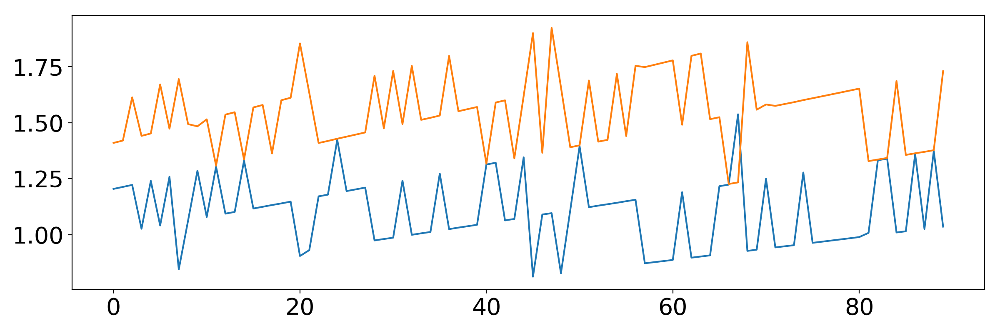

In [89]:
plt.close('all')
# wavelength solution is most accurate for band 1B
band = '1B'
# Get wavelength calibration pixel map
d2cMaps   = funcs.load_obj('d2cMaps_band{}_tr90pc'.format(band),path=d2cMapDir)
lambdaMap = d2cMaps['lambdaMap']
nslices = d2cMaps['nslices']
# load MRS images
ext_source_sci,ext_source_bkg = mrsobs.FM_MTS_BB_extended_source(lvl2path,band,bb_temp='800K')
ext_source_bkgsubtr = ext_source_sci-ext_source_bkg
# Pixel trace in MRS slice
sliceID,alpha_position = nslices/2,0.
ypos,xpos = funcs.detpixel_trace(band,d2cMaps,sliceID=sliceID,alpha_pos=alpha_position)

# Normalize the extended source spectrum to the fringe peak profile
if band == '1A':
    thres=0.3 
    min_dist=6
elif band == '1B':
    thres=0.3 
    min_dist=6
elif band == '1C':
    thres=0.3 
    min_dist=8
ext_source_norm = funcs.norm_fringe(np.flipud(ext_source_bkgsubtr[ypos,xpos]), thres=thres, min_dist=min_dist)
ext_source_norm_neg = funcs.norm_fringe(-np.flipud(ext_source_bkgsubtr[ypos,xpos]), thres=0., min_dist=min_dist)
# Compute zeroth order optical thickness of detector from fringe peak separation
fringepeaks_wavenumber = np.flipud(10000./lambdaMap[ypos,xpos])[ext_source_norm[1]]       # cm-1

# Compute first order optical thickness of detector from fitting Lorentzian profiles to the fringe peaks
wvnrs = np.flipud(10000./lambdaMap[ypos,xpos])
wvnr_arr = np.arange(wvnrs[0],wvnrs[-1],0.1)
sig_arr = np.flipud(ext_source_bkgsubtr[ypos,xpos])
sig_arr[np.isnan(sig_arr)] = 0
peaks = ext_source_norm[1]
troughs = ext_source_norm_neg[1]

plt.figure(figsize=(12,4))
plt.plot(wvnrs,sig_arr)
plt.plot(wvnrs[peaks],sig_arr[peaks],'ro')
plt.plot(wvnrs[troughs],sig_arr[troughs],'ko')
mu = np.zeros(len(peaks))
for i in [20]:# range(1,len(peaks)):
    amp = sig_arr[peaks[i]]
    mean = wvnrs[peaks[i]]
    sigma = 2*(wvnrs[peaks[i]+1] - wvnrs[peaks[i]])
    
    popt,pcov = curve_fit(funcs.lorentzian_profile,wvnrs[peaks[i]-2:peaks[i]+3],sig_arr[peaks[i]-2:peaks[i]+3],p0=[amp,mean,sigma],absolute_sigma=True,bounds=([0,0,0],[np.inf,np.inf,np.inf]))
    
    plt.plot(wvnr_arr,funcs.lorentzian_profile(wvnr_arr,*popt))
    mu[i] = popt[1]
plt.tight_layout()

left_sum,right_sum = [],[]
for i in range(1,len(peaks)-1):
    amp = sig_arr[peaks[i]]
    mean = wvnrs[peaks[i]]
    sigma = 2*(wvnrs[peaks[i]+1] - wvnrs[peaks[i]])
    
    popt,pcov = curve_fit(funcs.lorentzian_profile,wvnrs[peaks[i]-2:peaks[i]+3],sig_arr[peaks[i]-2:peaks[i]+3],p0=[amp,mean,sigma],absolute_sigma=True,bounds=([0,0,0],[np.inf,np.inf,np.inf]))
    mu = popt[1]
    
    lower,upper = troughs[(troughs>peaks[i-1]) & (troughs<peaks[i])][0]+1, troughs[(troughs>peaks[i]) & (troughs<peaks[i+1])][0]
    left_sum.append(mu-wvnrs[lower])
    right_sum.append(wvnrs[upper]-mu)

plt.figure(figsize=(12,4))
plt.plot(left_sum)
plt.plot(right_sum)
plt.tight_layout()

In [90]:
plt.close('all')
# wavelength solution is most accurate for band 1B
band = '1C'
# Get wavelength calibration pixel map
d2cMaps   = funcs.load_obj('d2cMaps_band{}_tr90pc'.format(band),path=d2cMapDir)
lambdaMap = d2cMaps['lambdaMap']
wvnrMap =  np.flipud(10000./lambdaMap)
distanceLeftMap = np.zeros(wvnrMap.shape)
distanceRightMap = np.zeros(wvnrMap.shape)
nslices = d2cMaps['nslices']
# load MRS images
ext_source_sci,ext_source_bkg = mrsobs.FM_MTS_BB_extended_source(lvl2path,band,bb_temp='800K')
ext_source_bkgsubtr = ext_source_sci-ext_source_bkg

# Pixel trace in MRS slice
alpha_position = 0.

if band == '1A':
    thres=0.3 
    min_dist=6
elif band == '1B':
    thres=0.3 
    min_dist=6
elif band == '1C':
    thres=0.3 
    min_dist=8

for islice in range(1,nslices+1):
    print 'Slice {}'.format(islice)
    ypos,xpos_alpha0 = funcs.detpixel_trace(band,d2cMaps,sliceID=islice,alpha_pos=alpha_position)
    
    for xpos_offset in range(-10,11):
        try:
            xpos = xpos_alpha0+xpos_offset
            # Normalize the extended source spectrum to the fringe peak profile
            ext_source_norm = funcs.norm_fringe(np.flipud(ext_source_bkgsubtr[ypos,xpos]), thres=thres, min_dist=min_dist)
            ext_source_norm_neg = funcs.norm_fringe(-np.flipud(ext_source_bkgsubtr[ypos,xpos]), thres=0., min_dist=min_dist)

            # Compute first order optical thickness of detector from fitting Lorentzian profiles to the fringe peaks
            wvnrs = np.flipud(10000./lambdaMap[ypos,xpos])
            sig_arr = np.flipud(ext_source_bkgsubtr[ypos,xpos])
            sig_arr[np.isnan(sig_arr)] = 0
            peaks = ext_source_norm[1]
            troughs = ext_source_norm_neg[1]

            dist_left,dist_right,wvnr_pos = [],[],[]
            for i in range(1,len(peaks)-1):
                amp = sig_arr[peaks[i]]
                mean = wvnrs[peaks[i]]
                sigma = 2*(wvnrs[peaks[i]+1] - wvnrs[peaks[i]])

                popt,pcov = curve_fit(funcs.lorentzian_profile,wvnrs[peaks[i]-2:peaks[i]+3],sig_arr[peaks[i]-2:peaks[i]+3],p0=[amp,mean,sigma],absolute_sigma=True,bounds=([0,0,0],[np.inf,np.inf,np.inf]))
                mu = popt[1]
                
                lower,upper = troughs[(troughs>peaks[i-1]) & (troughs<peaks[i])][0]+1, troughs[(troughs>peaks[i]) & (troughs<peaks[i+1])][0]
                dist_left.append(mu-wvnrs[lower])
                dist_right.append(wvnrs[upper]-mu)
                wvnr_pos.append(mu)
            dist_left,dist_right,wvnr_pos = np.array(dist_left),np.array(dist_right),np.array(wvnr_pos)
            
            interp_distanceLeft = InterpolatedUnivariateSpline(wvnr_pos,dist_left,k=3,ext=3)
            interp_distanceRight = InterpolatedUnivariateSpline(wvnr_pos,dist_right,k=3,ext=3)

            distanceLeftMap[ypos,xpos] = interp_distanceLeft(wvnrs)
            distanceRightMap[ypos,xpos] = interp_distanceRight(wvnrs)
        except:
            continue

Slice 1
Slice 2
Slice 3
Slice 4
Slice 5
Slice 6
Slice 7
Slice 8
Slice 9
Slice 10
Slice 11
Slice 12
Slice 13
Slice 14
Slice 15
Slice 16
Slice 17
Slice 18
Slice 19
Slice 20
Slice 21


<IPython.core.display.Javascript object>


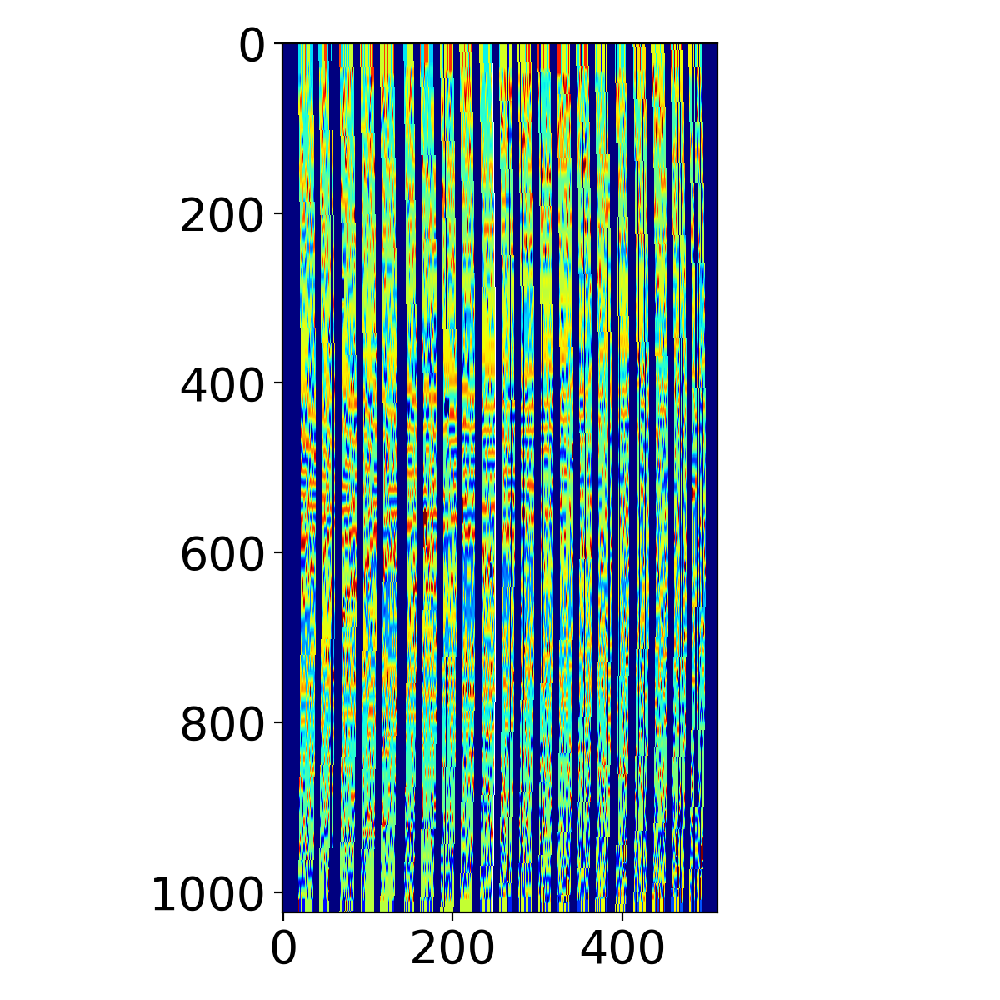

<IPython.core.display.Javascript object>


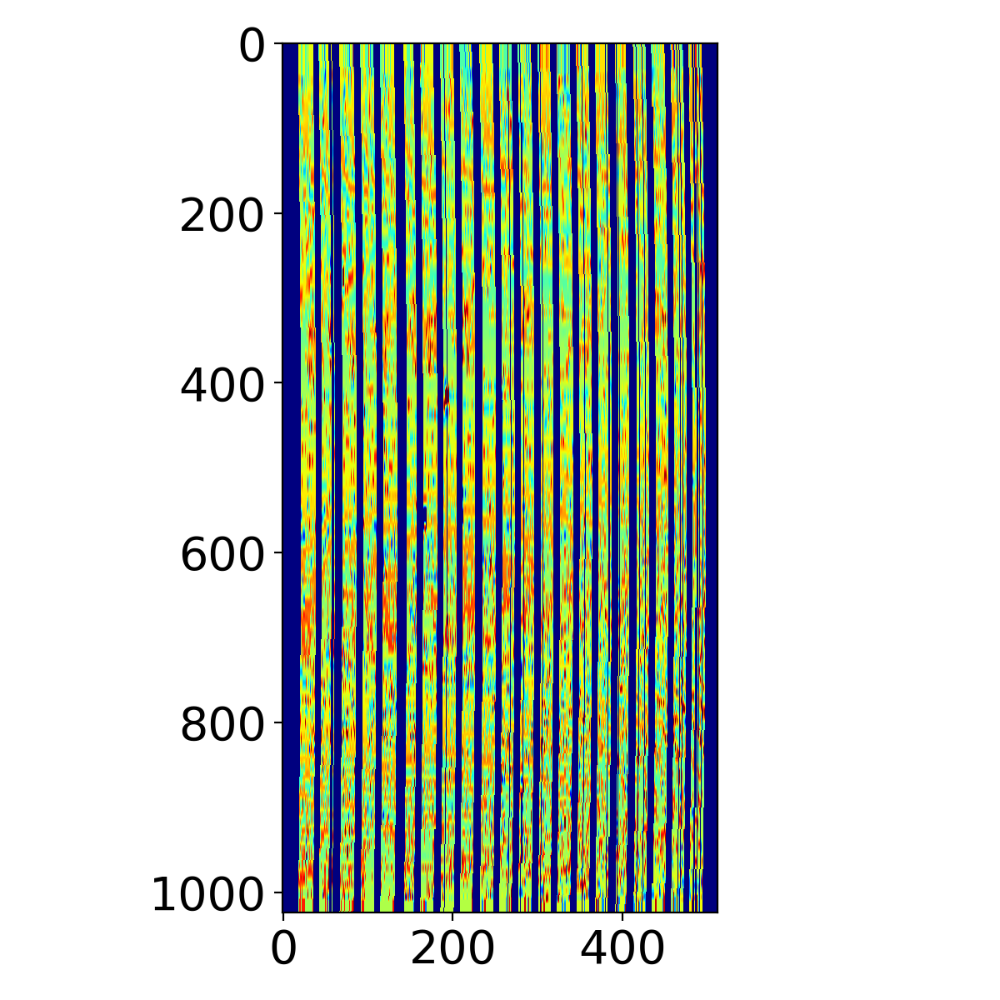

In [101]:
plt.figure(figsize=(6,6))
plt.imshow(distanceLeftMap[:,:512],vmin=0.8,vmax=1.4,cmap='jet')
plt.tight_layout()

plt.figure(figsize=(6,6))
plt.imshow(distanceRightMap[:,:512],vmin=1.,vmax=1.7,cmap='jet')
plt.tight_layout()

<IPython.core.display.Javascript object>


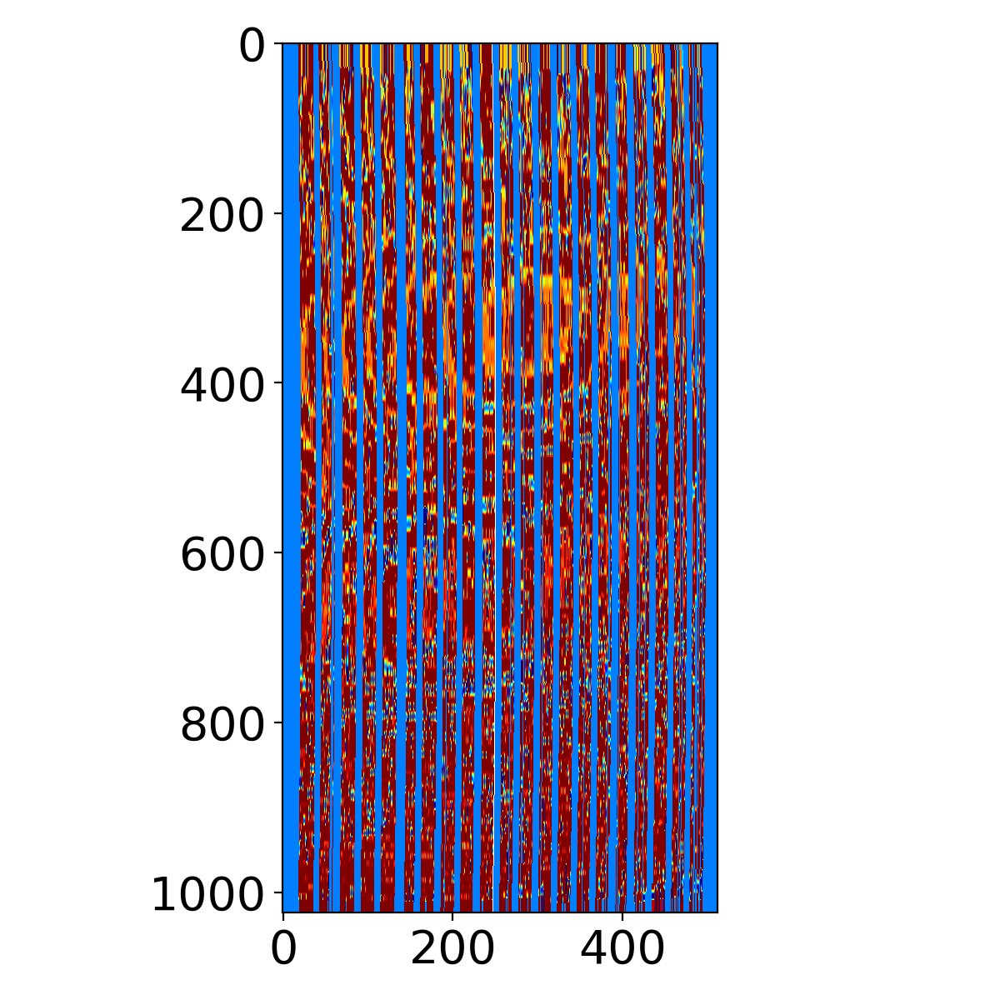

In [108]:
plt.figure(figsize=(6,6))
plt.imshow(distanceRightMap[:,:512]-distanceLeftMap[:,:512],vmin=-0.1,vmax=0.3,cmap='jet')
plt.tight_layout()